> Running dynamic CFG with the Stable Diffusion v2 model.

# Introduction

This notebook is an initial exploration of dynamic Classifier-free Guidance using the new Stable Diffusion v2 model.  

To leverage the best samplers, we also integrate the [k_diffusion](https://github.com/crowsonkb/k-diffusion/tree/master/k_diffusionhttps://github.com/crowsonkb/k-diffusion/tree/master/k_diffusion) library.

# Python imports

We start with a few python imports.

In [ ]:
import os
import random
from typing import Callable, List, Dict
from functools import partial
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

In [ ]:
#| echo: false
#: include: false
import tensorflow as tf
tf.get_logger().setLevel('INFO')

2022-11-28 18:22:40.147192: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-11-28 18:22:40.869264: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory
2022-11-28 18:22:40.869333: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory
2022-11-28 18:22:40.869340: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nv

## Seed for reproducibility

`seed_everything` makes sure that the results are reproducible across notebooks.

In [ ]:
# set the seed for rng
SEED = 4191151944 
def seed_everything(seed: int) -> torch.Generator:
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    generator = torch.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    return generator

# for sampling the initial, noisy latents
generator = seed_everything(SEED)

# Text prompt for image generations

Negative prompts appear to be very helpful in `v2`. At least, more helpful than they were for `v1.x` models.  

Below, we also borrow a prompt and negative-prompt format that's going around the Stable Diffusion discord. It seems to be a good starting point as the community figures out the new prompt structures. 

In [ ]:
# text prompt for image generations
prompt = "((a peaceful mountainside village in the Andes)), ((by Hayao Miyazaki)), studio lighting, High quality, professional, dramatic, cinematic movie still, very detailed, character art, concept art, focused, subsurface scatter"

# a good negative prompt
neg_prompt = "ugly, tiling, poorly drawn hands, poorly drawn feet, poorly drawn face, out of frame, mutation, mutated, extra limbs, extra legs, extra arms, disfigured, deformed, cross-eye, body out of frame, blurry, bad art, bad anatomy, blurred, text, watermark, grainy"

# Image and Sampler parameters

The images will be generated over $30$ diffusion steps. It will be a rather large `1024 x 1024` output.   

We are using the `DPM++ SDE Karras` sampler with 30 steps. This sampler seems to be working the best for high-quality outputs at the moment. The `2m Karras` schedule wins out on speed, however.  

If the image is too large or the generation is too slow on your machine, I'd suggest bumping down to a `768 x 768` resolution and using the `k_dpmpp_2m` sampler instead.  

In [ ]:
# number of diffusion steps
num_steps = 30    

# larger image dimensions
height = 1024 # 768
width  = 1024 # 768

# set the k-diffusion scheduler
use_k_diffusion  = 'k_dpmpp_sde'
hf_scheduler_kls = 'dpm_multi' # NOTE: only used for alpha_cumprod at the moment

# whether to use the Karras sigma schedule
use_karras_sigmas = True

# group the argument for generate function
gen_kwargs = {
    'height': height,
    'width': width, 
    'negative_prompt': neg_prompt, 
    'steps': num_steps,
    'use_karras_sigmas': use_karras_sigmas,
}


# Gathering Stable Diffusion models

For now, the `k_diffusion` integration is only working with the full, `768-v` model. The plan is to eventually support the base model as well.

In [ ]:

# group the different models to run
diffusion_runs = [

    # Stable Diffusion 2
    {'model_name': 'stabilityai/stable-diffusion-2',
     'model_kwargs': {
         'unet_attn_slice': True,
         'scheduler_kls':   hf_scheduler_kls,
         'use_k_diffusion': use_k_diffusion,
         'generator':       generator,
    }},

]

# Creating Guidance schedules

We create the Guidance schedules with the `cf_guidance` library.

However, it seems that our normalizations are broken in v2. This is likely due to the new `v-prediction` objective. So we avoid normalizations for now, and stick only with the `Inverse kDecay` schedules. 

In [ ]:
# helpers to create cosine schedules
from cf_guidance.schedules  import get_cos_sched

# transformations for classifier-free guidance
from cf_guidance.transforms import GuidanceTfm #, BaseNormGuidance, TNormGuidance, FullNormGuidance

### Schedule parameters  

Given how much the prompts have changed in v2, we are back in exploration territory as to what are the best parameters. Exciting times!  

Overall, it seems that the Guidance range is broader in v2. Folks are getting good results with low CFGs (3-5) or with higher values (9+). This is likely highly dependent on both the prompt and negative-prompt. We should know more as the stability.ai team releases their guides and tips.  

In [ ]:
# Default schedule parameters from the blog post
######################################
baseline_g        = 8    # default, static guidance value
max_val           = 9    # the max scheduled guidance scaling value
min_val           = 6    # the minimum scheduled guidance value
num_warmup_steps  = 0    # number of warmup steps
warmup_init_val   = 0    # the intial warmup value
num_cycles        = 0.5  # number of cosine cycles
k_decay           = 1    # k-decay for cosine curve scaling 


# group the default schedule parameters
DEFAULT_COS_PARAMS = {
    'max_val':           max_val,
    'num_steps':         num_steps,
    'min_val':           min_val,
    'num_cycles':        num_cycles,
    'k_decay':           k_decay,
    'num_warmup_steps':  num_warmup_steps,
    'warmup_init_val':   warmup_init_val,
}
######################################

The functions below quickly build different Guidance schedules. They are also re-used from the [previous notebooks](https://enzokro.dev/blog/posts/2022-11-26-guidance-expts-8/https://enzokro.dev/blog/posts/2022-11-26-guidance-expts-8/). 

In [ ]:
def cos_harness(default_params: dict, new_params: dict) -> dict:
    '''Creates cosine schedules with updated parameters in `new_params`
    '''
    # start from the given baseline `default_params`
    cos_params = dict(default_params)
    # update the with the new, given parameters
    cos_params.update(new_params)
    
    # return the new cosine schedule
    sched = get_cos_sched(**cos_params)
    return sched


def create_expts(params: dict, schedule_func: Callable) -> List[Dict]:
    '''Creates a list of experiments.
    
    Each element is a dictionary with the name, value, and schedule for a given parameter.
    A `title` field is also added for easy plotting.
    '''
    names = sorted(params)
    expts = []
    # step through parameter names and their values
    for i,name in enumerate(names):
        for j,val in enumerate(params[name]):
            # create the experiment
            expt = {'param_name': name,
                    'val': val,
                    'schedule': schedule_func(new_params={name: val})}
            # name for plotting
            expt['title'] = f'Param: "{name}", val={val}'
            # add it to the experiment list
            expts.append(expt)
    return expts

## Static baselines

First we create the constant, baseline Guidances.  

In [ ]:
# create the baseline schedule with the new function
baseline_params = {'max_val': [baseline_g]}
baseline_func = lambda *args, **kwargs: [baseline_g for _ in range(num_steps)]
baseline_expts = create_expts(baseline_params, baseline_func)

## Improving the baseline with scheduled Guidance

Now we build the most promising dynamic schedule: `Inverse kDecay` with a fast warmup.  

In [ ]:
# creating the inverse kDecay cosine schedules
k_decays = [0.1, 0.2, 0.3, 0.5]
inv_k_params = {'k_decay': k_decays}
inv_k_func = partial(cos_harness, default_params=DEFAULT_COS_PARAMS)
inv_k_expts = create_expts(inv_k_params, inv_k_func)

# invert the schedules to turn them into a type of warmup 
##TODO: move into the scheduler helper
for s in inv_k_expts:
    s['schedule'] = [max_val - g + min_val for g in s['schedule']]

# put all schedules together
all_k_expts = inv_k_expts

Let's plot these schedules to see what they look like.

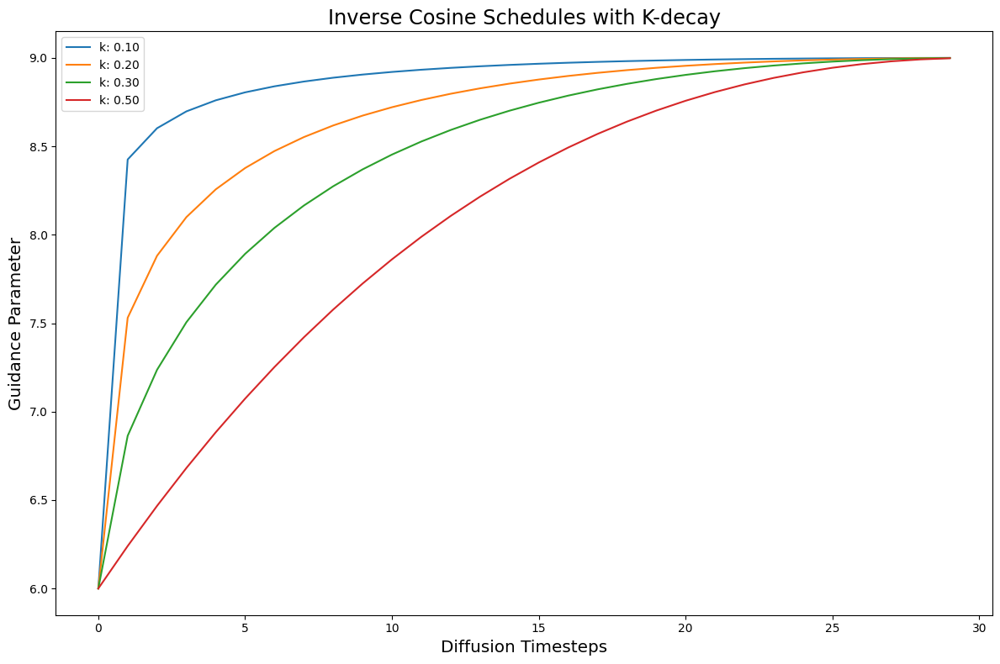

In [ ]:
#| echo: false
#| output: true
colors=list(mcolors.TABLEAU_COLORS)

# setup the plot
fig,ax = plt.subplots(figsize=(12,8))
plt.title('Inverse Cosine Schedules with K-decay', fontsize='xx-large')
plt.xlabel('Diffusion Timesteps', fontsize='x-large')
plt.ylabel('Guidance Parameter', fontsize='x-large')

# plot each k values
for idx,s in enumerate(inv_k_expts):
    ax.plot(s['schedule'], c=colors[idx], label=f'k: {s["val"]:.2f}')
    
plt.legend()
plt.tight_layout();

# Function to run the experiments

The code below loads the v2 Stable Diffusion model. It's also our harness to easily run many, different experiments. 

In [ ]:
# to load Stable Diffusion pipelines
from min_diffusion.core import MinimalDiffusion
# to plot generated images
from min_diffusion.utils import show_image, image_grid, plot_grid

In [ ]:
def load_sd_model(model_name, device, dtype, revision, model_kwargs={}):
    '''Loads the given `model_name` Stable Diffusion in `dtype` precision.  
    
    The model is placed on the `device` hardware. 
    The optional `generator` is used to create noisy latents.  
    Optional `model_kwargs` are passed to the model's load function.
    '''
    pipeline = MinimalDiffusion(model_name, device, dtype, revision, **model_kwargs)
    pipeline.load()
    return pipeline

In [ ]:
def run(pipeline, prompt, schedules, gen_kwargs={},
        guide_tfm=None, generator=None, show_each=False, test_run=False):
    """Runs a dynamic Classifier-free Guidance experiment. 
    
    Generates an image for the text `prompt` given all the values in `schedules`.
    Uses a Guidance Transformation class from the `cf_guidance` library.  
    Stores the output images with a matching title for plotting. 
    Optionally shows each image as its generated.
    If `test_run` is true, it runs a single schedule for testing. 
    """
    # store generated images and their title (the experiment name)
    images, titles = [], []
    
    # make sure we have a valid guidance transform
    assert guide_tfm
    print(f'Using Guidance Transform: {guide_tfm}')
    
    # optionally run a single test schedule
    if test_run:
        print(f'Running a single schedule for testing.')
        schedules = schedules[:1]
        
    # run all schedule experiments
    for i,s in enumerate(schedules):
        
        # parse out the title for the current run
        cur_title  = s['title']
        titles.append(cur_title)
        
        # create the guidance transformation 
        cur_sched = s['schedule']
        gtfm = guide_tfm({'g': cur_sched})
        
        print(f'Running experiment [{i+1} of {len(schedules)}]: {cur_title}...')
        with torch.autocast('cuda'):
            img = pipeline.generate(prompt, gtfm, **gen_kwargs)
        images.append(img)
        
        # optionally plot each generated image
        if show_each:
            show_image(img, scale=1)
            
    print('Done.')
    return {'images': images,
            'titles': titles}

# Generating the images

We put together all of the pieces above to generate images with Stable Diffusion v2. Both with our static baseline guidances, and the `Inverse-kDecay` schedules. 

In [ ]:
# stores the generated images
outputs = {}

# load the model on the GPU in full precision
device = 'cuda'
dtype = torch.float16
revision = "fp16"

# step through the Diffusion models
for dparams in diffusion_runs:
    # parse out model name and its custom args
    model_name   = dparams['model_name']
    model_kwargs = dparams['model_kwargs']
    
    # view some info about the run
    print(f'Running model: {dparams}')
    print(f'Generation kwargs: {gen_kwargs}')
    print(f'Using prompt: {prompt}')
    
    # load the current Diffusion model
    pipeline = load_sd_model(model_name, device, dtype, revision, model_kwargs=model_kwargs)
    
    # run the baseline, static Guidance
    baseline_res = run(pipeline, prompt, baseline_expts, gen_kwargs=gen_kwargs,
                       guide_tfm=GuidanceTfm, generator=generator)
    outputs[(model_name,'baseline')] = baseline_res
    
    # run the scheduled Guidances
    base_norm_res = run(pipeline, prompt, all_k_expts, gen_kwargs=gen_kwargs,
                        guide_tfm=GuidanceTfm, generator=generator)
    outputs[(model_name,'scheduled')] = base_norm_res
                                
    # cleanup GPU memory for the next model
    del pipeline
    pipeline = None
    torch.cuda.empty_cache()

Running model: {'model_name': 'stabilityai/stable-diffusion-2', 'model_kwargs': {'unet_attn_slice': True, 'better_vae': '', 'scheduler_kls': 'dpm_multi', 'use_k_diffusion': 'k_dpmpp_sde', 'generator': <torch._C.Generator object at 0x7f492216fc30>}}
Generation kwargs: {'height': 1024, 'width': 1024, 'negative_prompt': 'ugly, tiling, poorly drawn hands, poorly drawn feet, poorly drawn face, out of frame, mutation, mutated, extra limbs, extra legs, extra arms, disfigured, deformed, cross-eye, body out of frame, blurry, bad art, bad anatomy, blurred, text, watermark, grainy', 'steps': 30, 'use_karras_sigmas': True}
Using prompt: ((a peaceful mountainside village in the Andes)), ((by Hayao Miyazaki)), studio lighting, High quality, professional, dramatic, cinematic movie still, very detailed, character art, concept art, focused, subsurface scatter
Enabling default unet attention slicing.
Using scheduler: <class 'diffusers.schedulers.scheduling_dpmsolver_multistep.DPMSolverMultistepScheduler

  0%|          | 0/30 [00:00<?, ?it/s]

Done.
Using Guidance Transform: <class 'cf_guidance.transforms.GuidanceTfm'>
Running experiment [1 of 4]: Param: "k_decay", val=0.1...
Using negative prompt: ugly, tiling, poorly drawn hands, poorly drawn feet, poorly drawn face, out of frame, mutation, mutated, extra limbs, extra legs, extra arms, disfigured, deformed, cross-eye, body out of frame, blurry, bad art, bad anatomy, blurred, text, watermark, grainy
NOTE: Generating with k-diffusion Samplers: k_dpmpp_sde
Using Karras sigma schedule


  0%|          | 0/30 [00:00<?, ?it/s]

Running experiment [2 of 4]: Param: "k_decay", val=0.2...
Using negative prompt: ugly, tiling, poorly drawn hands, poorly drawn feet, poorly drawn face, out of frame, mutation, mutated, extra limbs, extra legs, extra arms, disfigured, deformed, cross-eye, body out of frame, blurry, bad art, bad anatomy, blurred, text, watermark, grainy
NOTE: Generating with k-diffusion Samplers: k_dpmpp_sde
Using Karras sigma schedule


  0%|          | 0/30 [00:00<?, ?it/s]

Running experiment [3 of 4]: Param: "k_decay", val=0.3...
Using negative prompt: ugly, tiling, poorly drawn hands, poorly drawn feet, poorly drawn face, out of frame, mutation, mutated, extra limbs, extra legs, extra arms, disfigured, deformed, cross-eye, body out of frame, blurry, bad art, bad anatomy, blurred, text, watermark, grainy
NOTE: Generating with k-diffusion Samplers: k_dpmpp_sde
Using Karras sigma schedule


  0%|          | 0/30 [00:00<?, ?it/s]

Running experiment [4 of 4]: Param: "k_decay", val=0.5...
Using negative prompt: ugly, tiling, poorly drawn hands, poorly drawn feet, poorly drawn face, out of frame, mutation, mutated, extra limbs, extra legs, extra arms, disfigured, deformed, cross-eye, body out of frame, blurry, bad art, bad anatomy, blurred, text, watermark, grainy
NOTE: Generating with k-diffusion Samplers: k_dpmpp_sde
Using Karras sigma schedule


  0%|          | 0/30 [00:00<?, ?it/s]

Done.


# Results

In [ ]:
#| echo: false

# names of all the models we tried
model_names = [
    'stabilityai/stable-diffusion-2',
    
    ##TODO: support base model
    # 'stabilityai/stable-diffusion-2-base',
]

# plot dimensions
plot_height, plot_width = height, width
# for the grid layout
num_scheds = 4
num_rows = 1

def get_results(model_name):
    types = [
        'baseline', 
        'scheduled', 
    ]
    return [(outputs[(model_name,t)], t) for t in types]

def plot_all_results(model_name):
    mres = get_results(model_name)
    for i in range(num_scheds):
        image_grid(
            [mres[0][0]['images'][0]] + [o[0]['images'][i] for o in mres[1:]], 
            title=[mres[0][0]['titles'][0]] + [f"{o[0]['titles'][i]}_{o[1]}" for o in mres[1:]],
            rows=num_rows, width=plot_width, height=plot_height
        )
        suptitle = "Inverse-kDecay Cosine" if i else "Constant"
        plt.suptitle(f'Model: {model_name} | {suptitle} Schedule')

## Stable Diffusion v2 images 

Here we plot all of the generated images.  

The image on the left is the baseline with a static, constant Guidance.\
The images on the right are the improvements with Guidance scheduling. Specifically, using the `Inverse-kDecay` cosine schedules with different values of `k`.

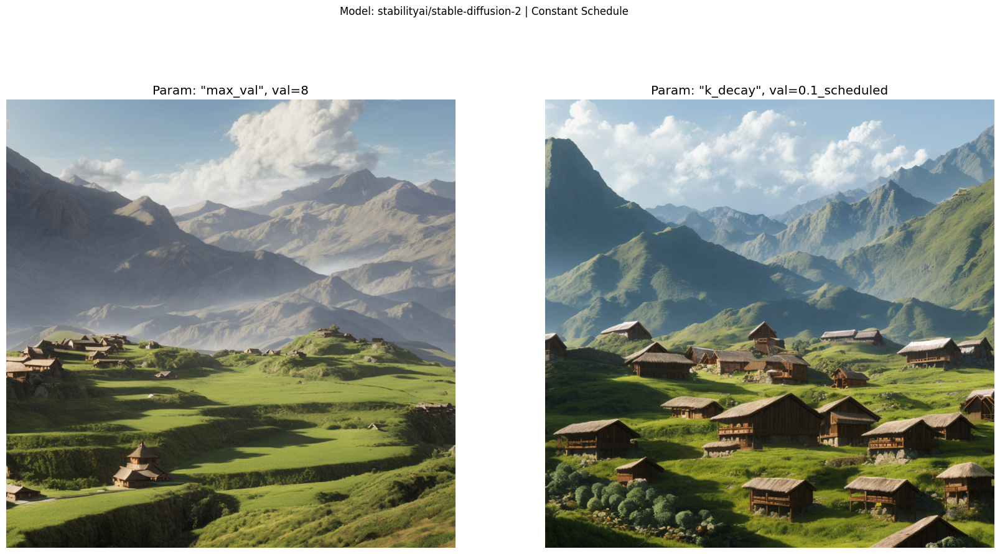

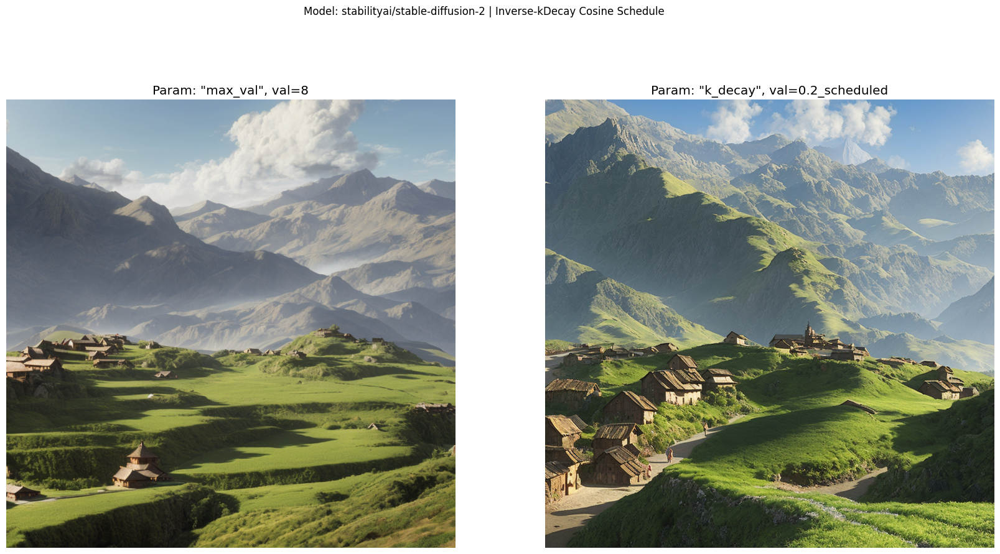

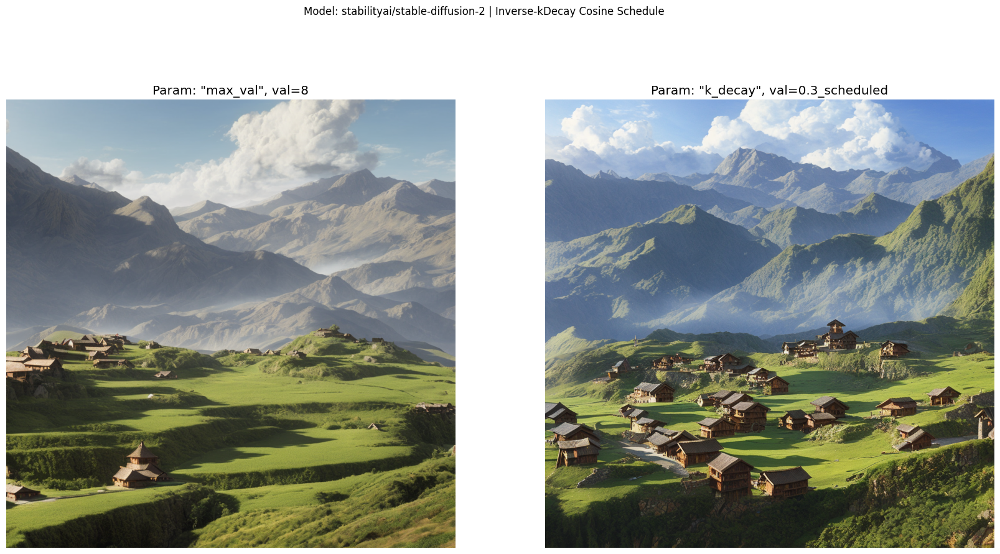

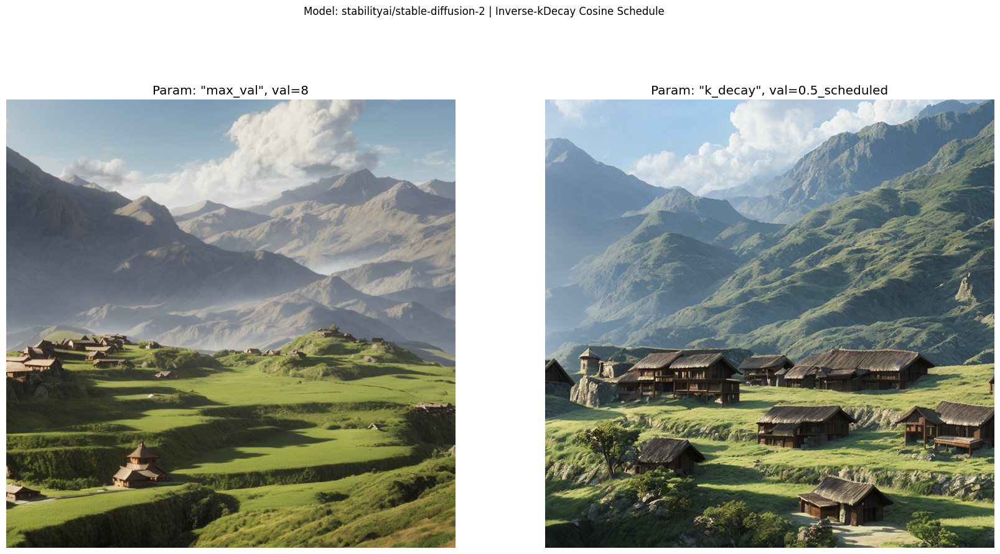

In [ ]:
plot_all_results('stabilityai/stable-diffusion-2')

# Conclusion

In this notebook we checked whether scheduling the Classifier-free Guidance improves the images generated by Stable Diffusion v2.  

At first glance, it seems that scheduling still helps! The scheduled generations have a lot more buildings and details. They seem to also better follow the prompt.   